# LAB 04: KEYPOINT DETECTION


## 1. Khai báo thư viện


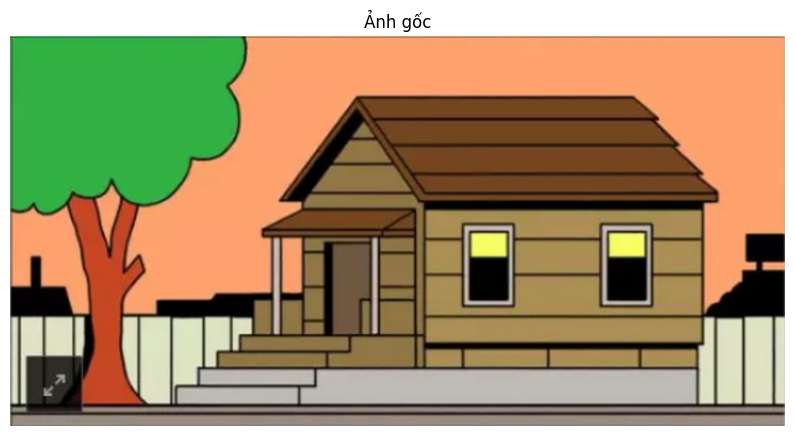

In [45]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from scipy.ndimage import gaussian_filter, maximum_filter
from scipy.signal import fftconvolve
import os

# Đọc ảnh và hiển thị
img = cv2.imread('image.png')
img_rgb = img[:, :, ::-1]  # Chuyển BGR -> RGB để hiển thị đúng màu

plt.figure(figsize=(10, 6))
plt.imshow(img_rgb)
plt.title('Ảnh gốc')
plt.axis('off')
plt.show()

# Chuyển sang ảnh xám cho các bước tiếp theo
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray_float = np.float32(gray)


## 2. Harris Corner Detection


2. HARRIS CORNER DETECTION


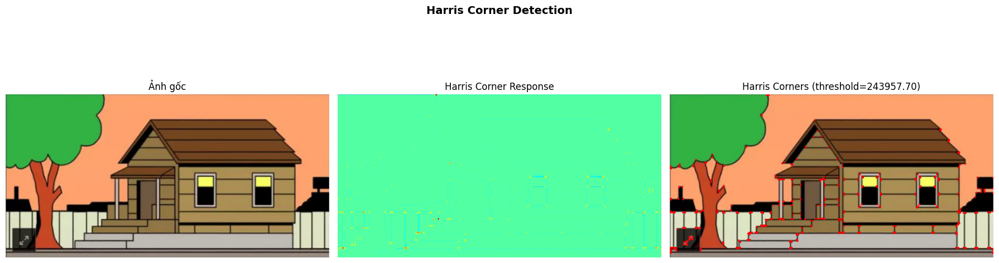

In [46]:

print("2. HARRIS CORNER DETECTION")


# Áp dụng Harris Corner Detection
# Tham số: ảnh xám float32, blockSize, ksize (Sobel), k (Harris parameter)
dst = cv2.cornerHarris(gray_float, blockSize=2, ksize=3, k=0.04)

# Phóng đại kết quả để dễ quan sát
dst = cv2.dilate(dst, None)

# Tạo bản sao ảnh để đánh dấu các corner
img_harris = img.copy()

# Ngưỡng để lọc các corner - lấy các điểm có giá trị > 1% giá trị max
threshold = 0.01 * dst.max()
img_harris[dst > threshold] = [0, 0, 255]  # Đánh dấu đỏ (BGR)

# Hiển thị kết quả
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(img_rgb)
axes[0].set_title('Ảnh gốc')
axes[0].axis('off')

axes[1].imshow(dst, cmap='jet')
axes[1].set_title('Harris Corner Response')
axes[1].axis('off')

axes[2].imshow(img_harris[:, :, ::-1])
axes[2].set_title(f'Harris Corners (threshold={threshold:.2f})')
axes[2].axis('off')

plt.suptitle('Harris Corner Detection', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


So sánh với các tham số blockSize khác nhau:


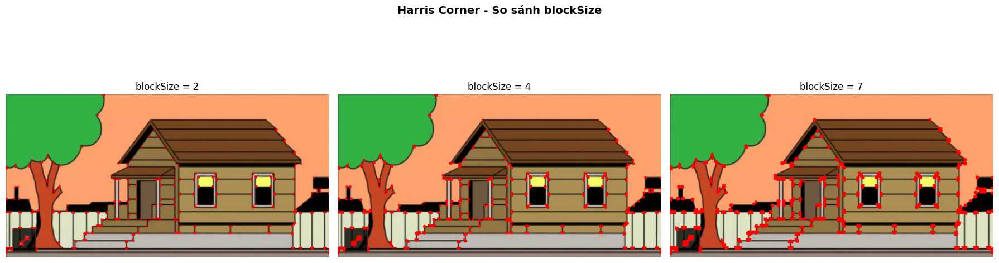

In [47]:
# Thử với các tham số khác nhau
print("\nSo sánh với các tham số blockSize khác nhau:")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, bs in enumerate([2, 4, 7]):
    dst_var = cv2.cornerHarris(gray_float, blockSize=bs, ksize=3, k=0.04)
    dst_var = cv2.dilate(dst_var, None)
    img_var = img.copy()
    img_var[dst_var > 0.01 * dst_var.max()] = [0, 0, 255]
    axes[i].imshow(img_var[:, :, ::-1])
    axes[i].set_title(f'blockSize = {bs}')
    axes[i].axis('off')
plt.suptitle('Harris Corner - So sánh blockSize', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

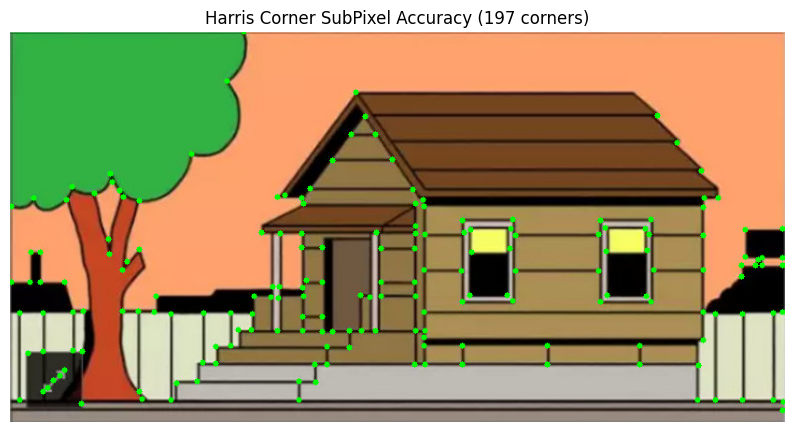

In [48]:
# Sử dụng cornerSubPix để tìm corner chính xác hơn (sub-pixel accuracy)
dst_sub = cv2.cornerHarris(gray_float, 2, 3, 0.04)
dst_sub = cv2.dilate(dst_sub, None)
ret, dst_sub = cv2.threshold(dst_sub, 0.01 * dst_sub.max(), 255, 0)
dst_sub = np.uint8(dst_sub)

# Tìm centroid của các corner
ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst_sub)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)
corners = cv2.cornerSubPix(gray_float, np.float32(centroids), (5, 5), (-1, -1), criteria)

img_subpix = img.copy()
for corner in corners[1:]:  # Bỏ qua centroid đầu tiên (background)
    x, y = int(corner[0]), int(corner[1])
    cv2.circle(img_subpix, (x, y), 3, (0, 255, 0), -1)

plt.figure(figsize=(10, 6))
plt.imshow(img_subpix[:, :, ::-1])
plt.title(f'Harris Corner SubPixel Accuracy ({len(corners)-1} corners)')
plt.axis('off')
plt.show()


## 3. Band-pass Filtering by Difference of Gaussians


3. BAND-PASS FILTERING BY DIFFERENCE OF GAUSSIANS (DoG)


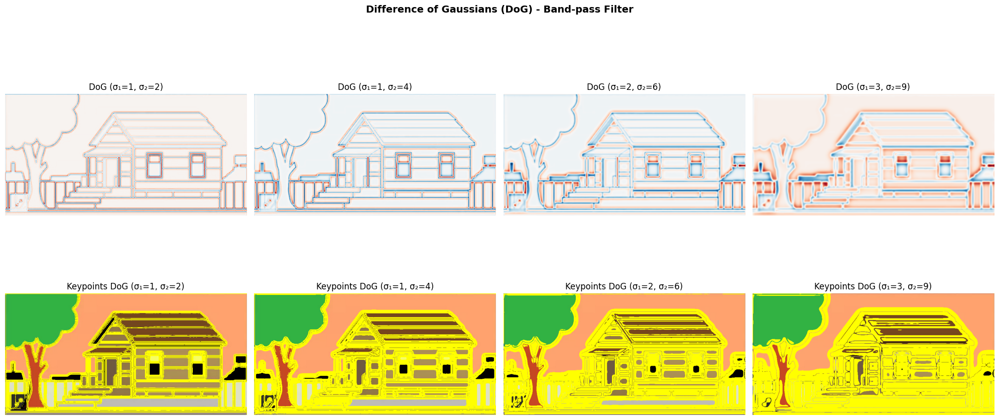

In [49]:
print("3. BAND-PASS FILTERING BY DIFFERENCE OF GAUSSIANS (DoG)")


def difference_of_gaussians(image, sigma1, sigma2):
    """Tính Difference of Gaussians (DoG) giữa hai sigma."""
    blur1 = gaussian_filter(image, sigma=sigma1)
    blur2 = gaussian_filter(image, sigma=sigma2)
    return blur1 - blur2

gray_norm = gray.astype(np.float64) / 255.0

# Áp dụng DoG với các cặp sigma khác nhau
sigma_pairs = [(1, 2), (1, 4), (2, 6), (3, 9)]
fig, axes = plt.subplots(2, len(sigma_pairs), figsize=(20, 10))

for i, (s1, s2) in enumerate(sigma_pairs):
    dog = difference_of_gaussians(gray_norm, s1, s2)
    
    # Hàng 1: Hiển thị DoG response
    axes[0, i].imshow(dog, cmap='RdBu_r')
    axes[0, i].set_title(f'DoG (σ₁={s1}, σ₂={s2})')
    axes[0, i].axis('off')
    
    # Hàng 2: Threshold để tìm keypoints
    dog_abs = np.abs(dog)
    threshold_dog = 0.02
    keypoints_mask = dog_abs > threshold_dog
    
    img_dog = img.copy()
    img_dog[keypoints_mask] = [0, 255, 255]
    axes[1, i].imshow(img_dog[:, :, ::-1])
    axes[1, i].set_title(f'Keypoints DoG (σ₁={s1}, σ₂={s2})')
    axes[1, i].axis('off')

plt.suptitle('Difference of Gaussians (DoG) - Band-pass Filter', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## 4. Automatic Scale Selection


4. AUTOMATIC SCALE SELECTION


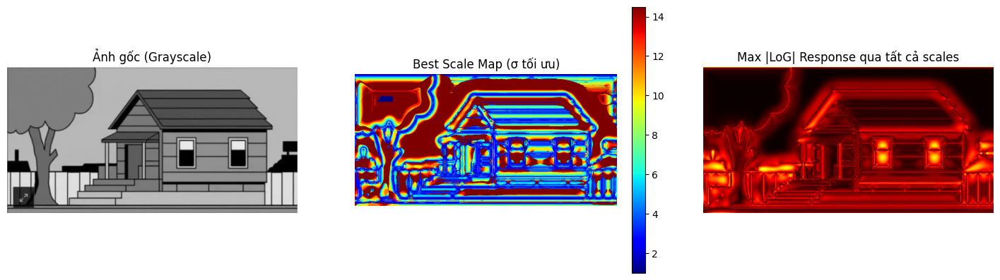

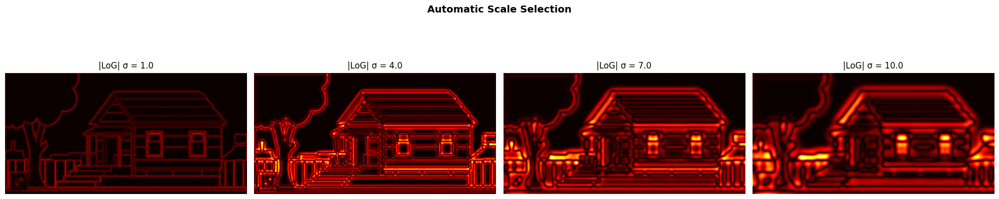

In [50]:
print("4. AUTOMATIC SCALE SELECTION")


def laplacian_of_gaussian(image, sigma):
    """Scale-normalized Laplacian of Gaussian."""
    blurred = gaussian_filter(image, sigma=sigma)
    # Laplacian bằng sai phân bậc hai
    laplacian = cv2.Laplacian(np.float64(blurred), cv2.CV_64F)
    # Scale normalization: nhân với sigma^2
    return sigma**2 * laplacian

# Tạo scale space với nhiều sigma
sigmas = np.arange(1, 15, 1.5)
scale_space = np.zeros((len(sigmas), gray_norm.shape[0], gray_norm.shape[1]))

for i, sigma in enumerate(sigmas):
    scale_space[i] = laplacian_of_gaussian(gray_norm, sigma)

# Tìm scale tối ưu cho mỗi pixel (Automatic Scale Selection)
best_scale_idx = np.argmax(np.abs(scale_space), axis=0)
best_scale = sigmas[best_scale_idx]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(gray_norm, cmap='gray')
axes[0].set_title('Ảnh gốc (Grayscale)')
axes[0].axis('off')

im = axes[1].imshow(best_scale, cmap='jet')
axes[1].set_title('Best Scale Map (σ tối ưu)')
axes[1].axis('off')
plt.colorbar(im, ax=axes[1], fraction=0.046)

# Hiển thị LoG response ở một số scale đại diện
n_show = min(4, len(sigmas))
fig2, axes2 = plt.subplots(1, n_show, figsize=(20, 5))
for i in range(n_show):
    idx = i * (len(sigmas) // n_show)
    axes2[i].imshow(np.abs(scale_space[idx]), cmap='hot')
    axes2[i].set_title(f'|LoG| σ = {sigmas[idx]:.1f}')
    axes2[i].axis('off')

# Hiển thị response mạnh nhất qua các scale
max_response = np.max(np.abs(scale_space), axis=0)
axes[2].imshow(max_response, cmap='hot')
axes[2].set_title('Max |LoG| Response qua tất cả scales')
axes[2].axis('off')

plt.suptitle('Automatic Scale Selection', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
plt.show()


## 5. Scale Invariant Detection


5. SCALE INVARIANT DETECTION


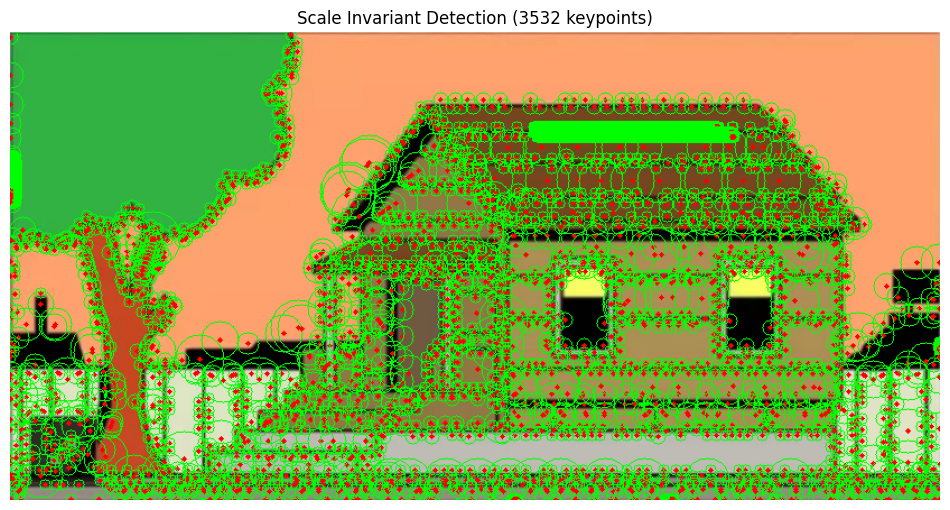

Số keypoints phát hiện: 3532


In [51]:

print("5. SCALE INVARIANT DETECTION")


def detect_scale_invariant_keypoints(image, sigmas, threshold=0.03):
    """
    Phát hiện keypoint bất biến theo tỉ lệ (scale invariant).
    Tìm local extrema trong scale-space (x, y, sigma).
    """
    scale_space = np.zeros((len(sigmas), image.shape[0], image.shape[1]))
    for i, sigma in enumerate(sigmas):
        scale_space[i] = sigma**2 * gaussian_filter(
            cv2.Laplacian(gaussian_filter(image, sigma), cv2.CV_64F), sigma=0.5
        )
    
    keypoints = []
    for i in range(1, len(sigmas) - 1):
        # Local maximum trong 3x3x3 neighborhood
        local_max = maximum_filter(np.abs(scale_space[i-1:i+2]), size=(3, 3, 3))
        is_peak = (np.abs(scale_space[i]) == local_max[1]) & \
                  (np.abs(scale_space[i]) > threshold)
        
        ys, xs = np.where(is_peak)
        for y, x in zip(ys, xs):
            keypoints.append((x, y, sigmas[i], np.abs(scale_space[i, y, x])))
    
    return keypoints

sigmas_inv = np.arange(1, 12, 1.0)
keypoints_si = detect_scale_invariant_keypoints(gray_norm, sigmas_inv, threshold=0.02)

# Vẽ keypoints với kích thước tỷ lệ theo sigma
img_si = img.copy()
for (x, y, sigma, response) in keypoints_si:
    radius = int(sigma * 2.5)
    cv2.circle(img_si, (int(x), int(y)), radius, (0, 255, 0), 1)
    cv2.circle(img_si, (int(x), int(y)), 2, (0, 0, 255), -1)

plt.figure(figsize=(12, 7))
plt.imshow(img_si[:, :, ::-1])
plt.title(f'Scale Invariant Detection ({len(keypoints_si)} keypoints)')
plt.axis('off')
plt.show()

print(f"Số keypoints phát hiện: {len(keypoints_si)}")


## 6. Scale-space Blob Detector


6. SCALE-SPACE BLOB DETECTOR


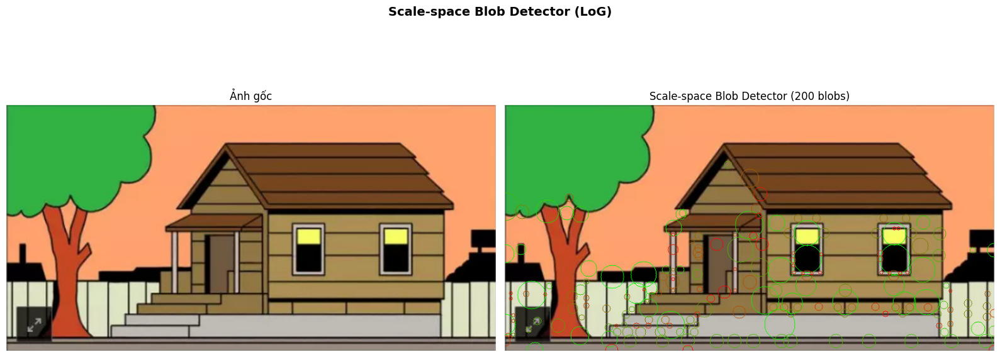

In [52]:

print("6. SCALE-SPACE BLOB DETECTOR")


def scale_space_blob_detector(image, min_sigma=1, max_sigma=15, num_sigma=12, threshold=0.05):
    """
    Scale-space blob detector sử dụng Laplacian of Gaussian (LoG).
    Phát hiện các blob (vùng đồng nhất) ở nhiều tỉ lệ khác nhau.
    """
    sigmas = np.linspace(min_sigma, max_sigma, num_sigma)
    
    # Xây dựng scale space
    log_scale_space = np.zeros((num_sigma, image.shape[0], image.shape[1]))
    for i, sigma in enumerate(sigmas):
        # LoG xấp xỉ bằng DoG
        s1 = sigma
        s2 = sigma * 1.6  # Tỉ lệ k ≈ 1.6 (theo SIFT paper)
        g1 = gaussian_filter(image, s1)
        g2 = gaussian_filter(image, s2)
        log_scale_space[i] = sigma**2 * (g2 - g1) / (s2 - s1)
    
    # Tìm local maxima trong 3D (x, y, scale)
    blobs = []
    for i in range(1, num_sigma - 1):
        prev_scale = np.abs(log_scale_space[i-1])
        curr_scale = np.abs(log_scale_space[i])
        next_scale = np.abs(log_scale_space[i+1])
        
        stack = np.stack([prev_scale, curr_scale, next_scale])
        local_max = maximum_filter(stack, size=(3, 7, 7))
        
        is_peak = (curr_scale == local_max[1]) & (curr_scale > threshold)
        
        ys, xs = np.where(is_peak)
        for y, x in zip(ys, xs):
            blobs.append((x, y, sigmas[i] * np.sqrt(2), curr_scale[y, x]))
    
    # Sắp xếp theo response giảm dần
    blobs.sort(key=lambda b: b[3], reverse=True)
    return blobs

blobs = scale_space_blob_detector(gray_norm, min_sigma=1, max_sigma=20, 
                                   num_sigma=15, threshold=0.01)

# Vẽ blobs
img_blob = img.copy()
for i, (x, y, r, resp) in enumerate(blobs[:200]):  # Chỉ vẽ 200 blobs mạnh nhất
    color = (0, int(255 * (1 - i/200)), int(255 * i/200))
    cv2.circle(img_blob, (int(x), int(y)), int(r), color, 1)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
axes[0].imshow(img_rgb)
axes[0].set_title('Ảnh gốc')
axes[0].axis('off')

axes[1].imshow(img_blob[:, :, ::-1])
axes[1].set_title(f'Scale-space Blob Detector ({min(len(blobs), 200)} blobs)')
axes[1].axis('off')

plt.suptitle('Scale-space Blob Detector (LoG)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

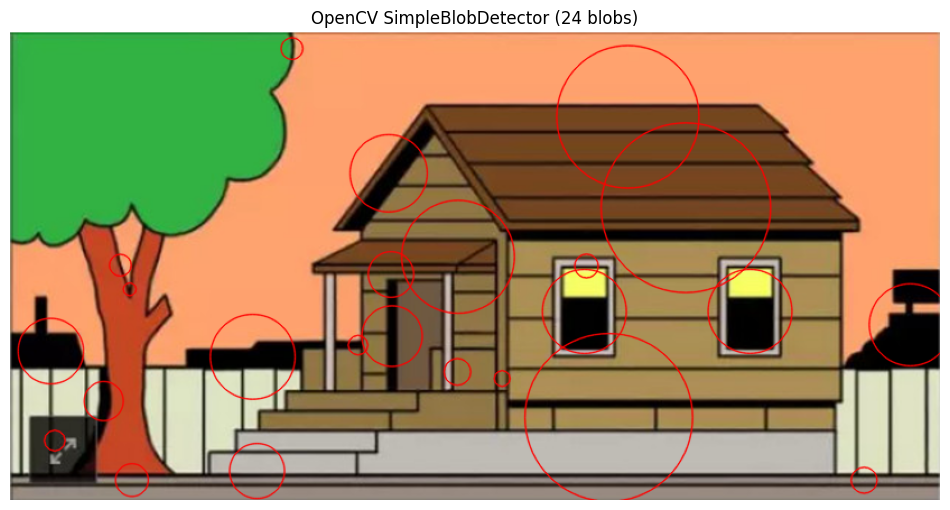

In [53]:
# Sử dụng SimpleBlobDetector của OpenCV để so sánh
params = cv2.SimpleBlobDetector_Params()
params.minThreshold = 10
params.maxThreshold = 200
params.filterByArea = True
params.minArea = 30
params.filterByCircularity = False
params.filterByConvexity = False
params.filterByInertia = False

detector = cv2.SimpleBlobDetector_create(params)
keypoints_blob = detector.detect(gray)

img_blob_cv = cv2.drawKeypoints(img, keypoints_blob, None,
                                 (0, 0, 255),
                                 cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(12, 7))
plt.imshow(img_blob_cv[:, :, ::-1])
plt.title(f'OpenCV SimpleBlobDetector ({len(keypoints_blob)} blobs)')
plt.axis('off')
plt.show()


## 7. Bag-of-Words Detection


In [54]:

print("7. BAG-OF-WORDS DETECTION")


7. BAG-OF-WORDS DETECTION


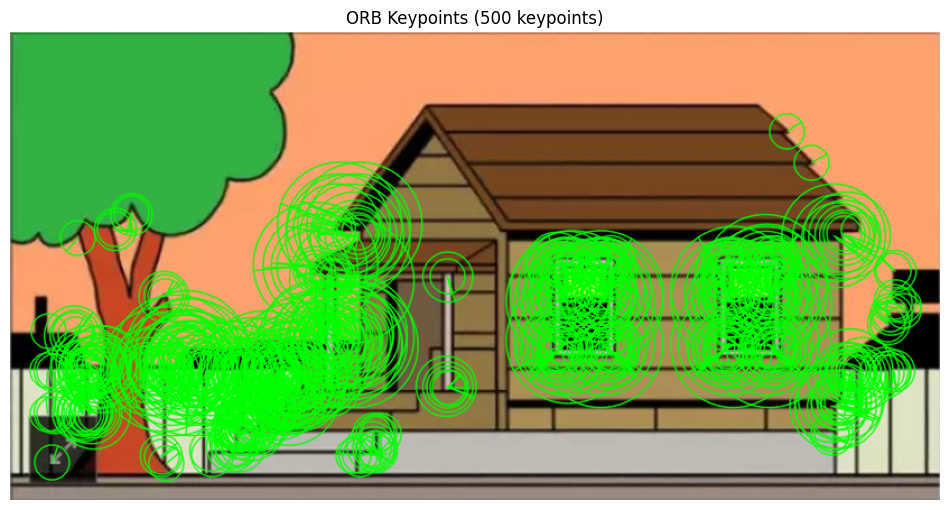

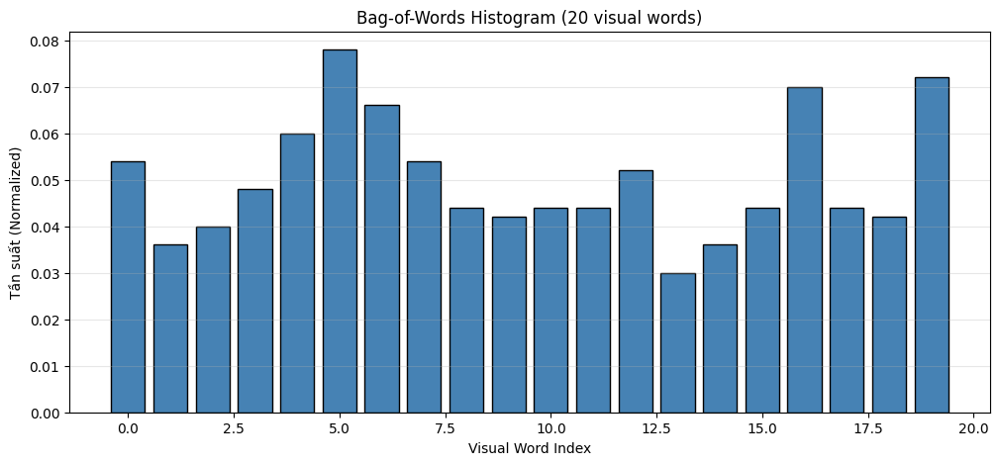

Số descriptors: 500
Số visual words (K): 20
BoW vector shape: (20,)


In [55]:
# Sử dụng ORB (thay thế SIFT cho non-patent) để trích xuất features
orb = cv2.ORB_create(nfeatures=500)

# Phát hiện keypoints và tính descriptors
kp_orb, des_orb = orb.detectAndCompute(gray, None)

# Vẽ keypoints
img_orb = cv2.drawKeypoints(img, kp_orb, None, color=(0, 255, 0), 
                             flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(12, 7))
plt.imshow(img_orb[:, :, ::-1])
plt.title(f'ORB Keypoints ({len(kp_orb)} keypoints)')
plt.axis('off')
plt.show()

# Mô phỏng Bag-of-Words: tạo visual vocabulary từ ảnh này
# Trong thực tế, vocabulary được tạo từ nhiều ảnh khác nhau
if des_orb is not None:
    # Sử dụng K-Means clustering để tạo visual words
    K = 20  # Số visual words
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    des_float = np.float32(des_orb)
    ret, labels, centers = cv2.kmeans(des_float, K, None, criteria, 10, 
                                       cv2.KMEANS_PP_CENTERS)
    
    # Tạo histogram (bag-of-words representation)
    bow_histogram = np.zeros(K)
    for label in labels:
        bow_histogram[label[0]] += 1
    
    # Chuẩn hóa histogram
    bow_histogram = bow_histogram / bow_histogram.sum()
    
    plt.figure(figsize=(12, 5))
    plt.bar(range(K), bow_histogram, color='steelblue', edgecolor='black')
    plt.xlabel('Visual Word Index')
    plt.ylabel('Tần suất (Normalized)')
    plt.title(f'Bag-of-Words Histogram ({K} visual words)')
    plt.grid(axis='y', alpha=0.3)
    plt.show()
    
    print(f"Số descriptors: {len(des_orb)}")
    print(f"Số visual words (K): {K}")
    print(f"BoW vector shape: {bow_histogram.shape}")


## 8. Image Panoramas


8. IMAGE PANORAMAS
Kích thước ảnh gốc: (418, 830, 3)
Ảnh trái: (418, 664, 3), Ảnh phải: (418, 664, 3)


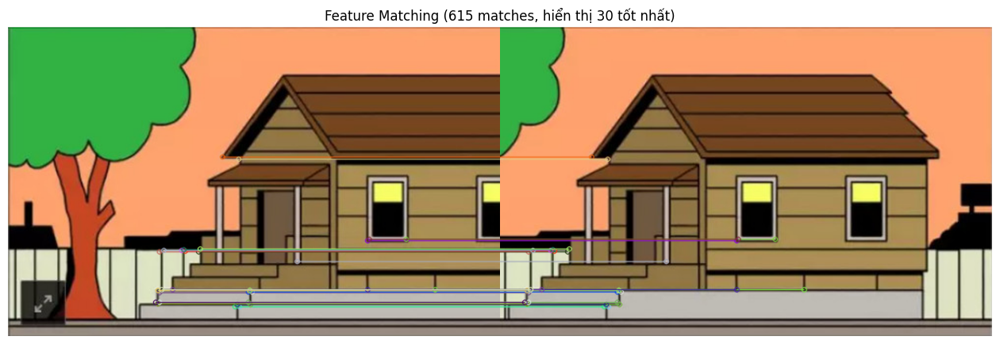

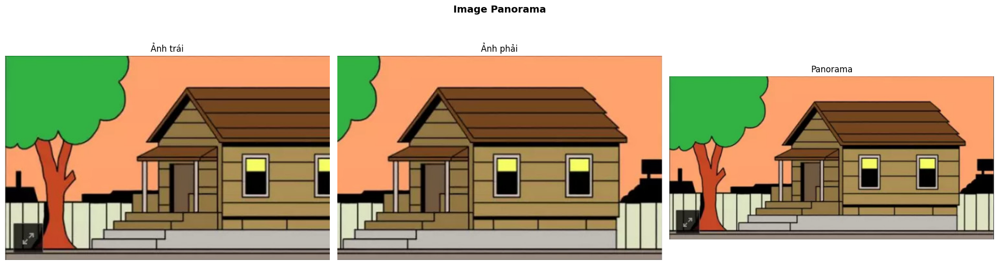

Homography matrix:
[[ 9.98754346e-01 -5.30885536e-04  1.66165830e+02]
 [-4.13296281e-04  9.99784451e-01  7.27793042e-02]
 [-1.77304746e-06  2.31010561e-07  1.00000000e+00]]


In [56]:

print("8. IMAGE PANORAMAS")


# Tạo 2 view từ ảnh gốc bằng cách cắt phần trái/phải (có overlap)
h, w = img.shape[:2]
overlap = int(w * 0.3)  # 30% overlap

img_left = img[:, :w//2 + overlap]
img_right = img[:, w//2 - overlap:]

print(f"Kích thước ảnh gốc: {img.shape}")
print(f"Ảnh trái: {img_left.shape}, Ảnh phải: {img_right.shape}")

# Phát hiện features và match
orb_pano = cv2.ORB_create(nfeatures=1000)
kp1, des1 = orb_pano.detectAndCompute(img_left, None)
kp2, des2 = orb_pano.detectAndCompute(img_right, None)

# Matching bằng BFMatcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Vẽ matches
img_matches = cv2.drawMatches(img_left, kp1, img_right, kp2,
                               matches[:30], None,
                               flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16, 6))
plt.imshow(img_matches[:, :, ::-1])
plt.title(f'Feature Matching ({len(matches)} matches, hiển thị 30 tốt nhất)')
plt.axis('off')
plt.show()

# Tính Homography và warp
if len(matches) >= 4:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
    
    if H is not None:
        # Warp ảnh phải sang hệ tọa độ ảnh trái
        result_width = img_left.shape[1] + img_right.shape[1]
        result_height = max(img_left.shape[0], img_right.shape[0])
        
        panorama = cv2.warpPerspective(img_right, H, (result_width, result_height))
        panorama[0:img_left.shape[0], 0:img_left.shape[1]] = img_left
        
        # Cắt vùng đen
        gray_pano = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
        cols = np.any(gray_pano > 0, axis=0)
        rows = np.any(gray_pano > 0, axis=1)
        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]
        panorama = panorama[rmin:rmax+1, cmin:cmax+1]
        
        fig, axes = plt.subplots(1, 3, figsize=(20, 6))
        axes[0].imshow(img_left[:, :, ::-1])
        axes[0].set_title('Ảnh trái')
        axes[0].axis('off')
        
        axes[1].imshow(img_right[:, :, ::-1])
        axes[1].set_title('Ảnh phải')
        axes[1].axis('off')
        
        axes[2].imshow(panorama[:, :, ::-1])
        axes[2].set_title('Panorama')
        axes[2].axis('off')
        
        plt.suptitle('Image Panorama', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()
        
        print(f"Homography matrix:\n{H}")
    else:
        print("Không tìm được Homography phù hợp.")
else:
    print(f"Không đủ matches ({len(matches)} < 4).")


## 9. Automatic Mosaicing


9. AUTOMATIC MOSAICING


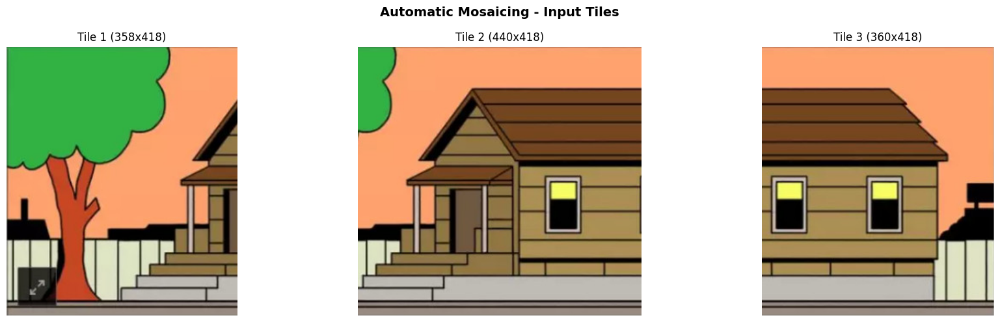

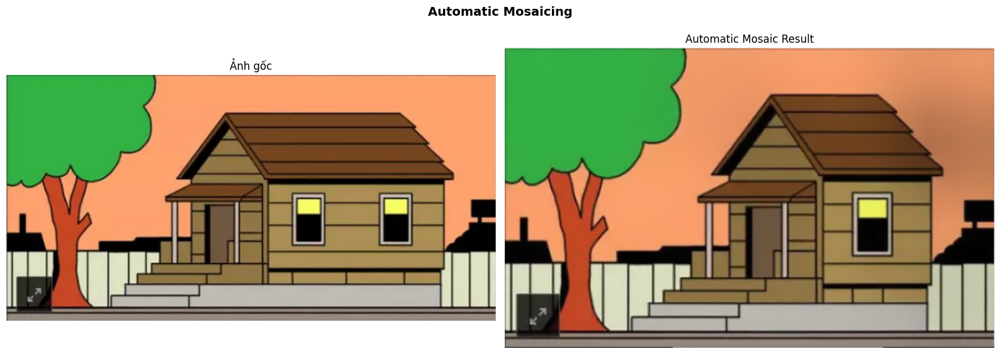

Mosaic thành công!


In [57]:

print("9. AUTOMATIC MOSAICING")


# Tạo nhiều mảnh ảnh (tiles) với overlap
def create_tiles(image, num_cols=3, overlap_ratio=0.25):
    """Chia ảnh thành nhiều mảnh có phần chồng lấp."""
    h, w = image.shape[:2]
    tile_w = w // num_cols
    overlap = int(tile_w * overlap_ratio)
    
    tiles = []
    for i in range(num_cols):
        start = max(0, i * tile_w - overlap)
        end = min(w, (i + 1) * tile_w + overlap)
        tiles.append(image[:, start:end])
    return tiles

tiles = create_tiles(img, num_cols=3, overlap_ratio=0.3)

# Hiển thị các tiles
fig, axes = plt.subplots(1, len(tiles), figsize=(18, 5))
for i, tile in enumerate(tiles):
    axes[i].imshow(tile[:, :, ::-1])
    axes[i].set_title(f'Tile {i+1} ({tile.shape[1]}x{tile.shape[0]})')
    axes[i].axis('off')
plt.suptitle('Automatic Mosaicing - Input Tiles', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Ghép tự động sử dụng Stitcher của OpenCV
try:
    stitcher = cv2.Stitcher_create(cv2.Stitcher_PANORAMA)
    status, mosaic = stitcher.stitch(tiles)
    
    if status == cv2.Stitcher_OK:
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        axes[0].imshow(img_rgb)
        axes[0].set_title('Ảnh gốc')
        axes[0].axis('off')
        
        axes[1].imshow(mosaic[:, :, ::-1])
        axes[1].set_title('Automatic Mosaic Result')
        axes[1].axis('off')
        
        plt.suptitle('Automatic Mosaicing', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()
        print("Mosaic thành công!")
    else:
        status_msg = {1: "ERR_NEED_MORE_IMGS", 2: "ERR_HOMOGRAPHY_EST_FAIL",
                      3: "ERR_CAMERA_PARAMS_ADJUST_FAIL"}
        print(f"Stitcher thất bại: {status_msg.get(status, 'Unknown')}")
        print("Thử phương pháp manual stitching...")
except Exception as e:
    print(f"Stitcher error: {e}")
    print("Thử phương pháp manual stitching...")


Manual mosaicing bằng homography chain:


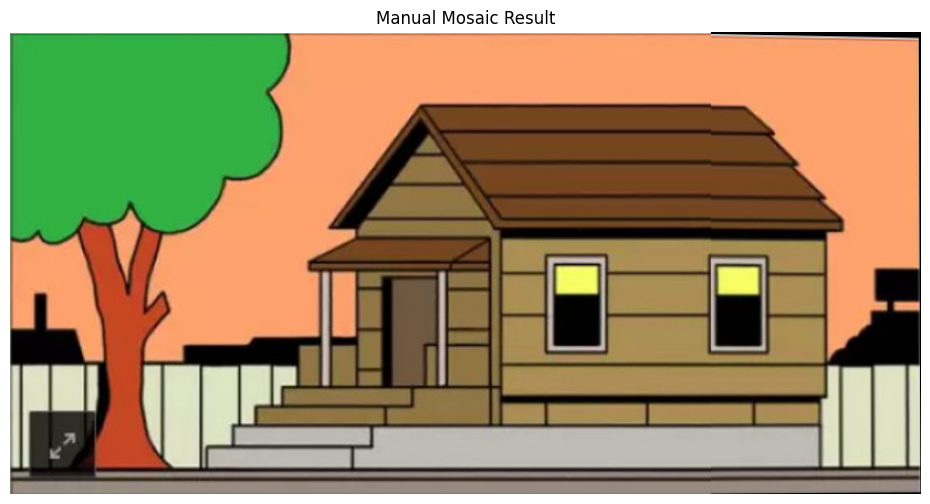

In [58]:
# Manual mosaicing bằng homography chain
print("\nManual mosaicing bằng homography chain:")
if len(tiles) >= 2:
    mosaic_result = tiles[0].copy()
    
    for i in range(1, len(tiles)):
        kp_m1, des_m1 = orb_pano.detectAndCompute(mosaic_result, None)
        kp_m2, des_m2 = orb_pano.detectAndCompute(tiles[i], None)
        
        if des_m1 is not None and des_m2 is not None:
            matches_m = bf.match(des_m1, des_m2)
            matches_m = sorted(matches_m, key=lambda x: x.distance)
            
            if len(matches_m) >= 4:
                src = np.float32([kp_m1[m.queryIdx].pt for m in matches_m[:50]]).reshape(-1, 1, 2)
                dst = np.float32([kp_m2[m.trainIdx].pt for m in matches_m[:50]]).reshape(-1, 1, 2)
                
                H_m, _ = cv2.findHomography(dst, src, cv2.RANSAC, 5.0)
                if H_m is not None:
                    result_w = mosaic_result.shape[1] + tiles[i].shape[1]
                    result_h = max(mosaic_result.shape[0], tiles[i].shape[0])
                    warped = cv2.warpPerspective(tiles[i], H_m, (result_w, result_h))
                    warped[0:mosaic_result.shape[0], 0:mosaic_result.shape[1]] = mosaic_result
                    
                    # Cắt viền đen
                    g = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
                    c = np.any(g > 0, axis=0)
                    r = np.any(g > 0, axis=1)
                    if c.any() and r.any():
                        mosaic_result = warped[np.where(r)[0][0]:np.where(r)[0][-1]+1,
                                               np.where(c)[0][0]:np.where(c)[0][-1]+1]
    
    plt.figure(figsize=(14, 6))
    plt.imshow(mosaic_result[:, :, ::-1])
    plt.title('Manual Mosaic Result')
    plt.axis('off')
    plt.show()


## 10. Wide Base-line Stereo


10. WIDE BASE-LINE STEREO


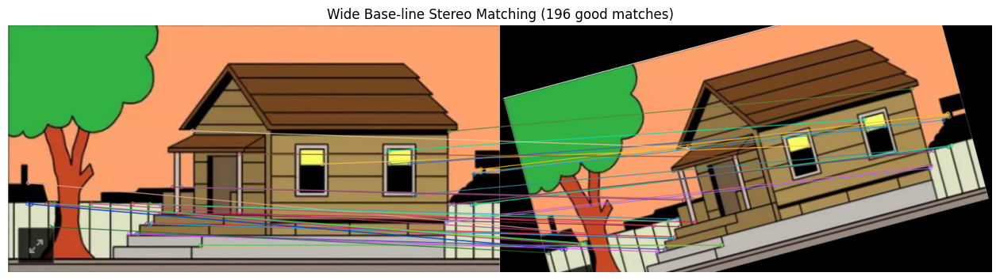

In [59]:

print("10. WIDE BASE-LINE STEREO")


# Mô phỏng wide baseline bằng cách tạo 2 view với biến đổi affine
h, w = img.shape[:2]
center = (w // 2, h // 2)

# View 1: Ảnh gốc
view1 = img.copy()

# View 2: Xoay và scale nhẹ (mô phỏng camera ở vị trí khác)
angle = 15  # Xoay 15 độ
scale = 0.9
M_rot = cv2.getRotationMatrix2D(center, angle, scale)
view2 = cv2.warpAffine(img, M_rot, (w, h))

# Phát hiện keypoints bằng ORB
orb_wb = cv2.ORB_create(nfeatures=500)
kp_wb1, des_wb1 = orb_wb.detectAndCompute(view1, None)
kp_wb2, des_wb2 = orb_wb.detectAndCompute(view2, None)

# Matching
bf_wb = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
matches_wb = bf_wb.knnMatch(des_wb1, des_wb2, k=2)

# Ratio test (Lowe's ratio)
good_matches = []
for m, n in matches_wb:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Vẽ matches
img_wb_matches = cv2.drawMatches(view1, kp_wb1, view2, kp_wb2,
                                  good_matches[:40], None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16, 6))
plt.imshow(img_wb_matches[:, :, ::-1])
plt.title(f'Wide Base-line Stereo Matching ({len(good_matches)} good matches)')
plt.axis('off')
plt.show()

Fundamental Matrix:
[[ 7.52782769e-06 -2.80866348e-05  5.07299682e-03]
 [ 2.83726883e-05  7.72784604e-06 -8.11199554e-03]
 [-9.86187828e-03  4.90356114e-03  1.00000000e+00]]
Inliers: 188/196


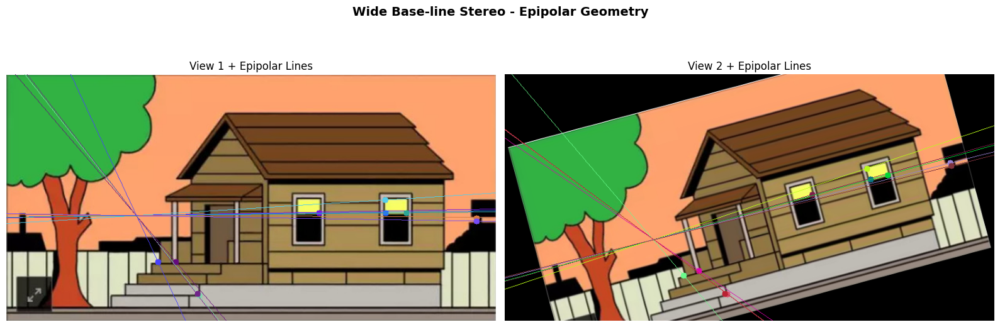

In [60]:
# Tính Fundamental Matrix
if len(good_matches) >= 8:
    pts1 = np.float32([kp_wb1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp_wb2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    
    F, mask_f = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)
    
    if F is not None:
        print(f"Fundamental Matrix:\n{F}")
        print(f"Inliers: {mask_f.sum()}/{len(good_matches)}")
        
        # Vẽ epipolar lines
        inlier_pts1 = pts1[mask_f.ravel() == 1]
        inlier_pts2 = pts2[mask_f.ravel() == 1]
        
        def draw_epilines(img1, img2, pts1, pts2, F):
            """Vẽ epipolar lines."""
            lines = cv2.computeCorrespondEpilines(pts2, 2, F).reshape(-1, 3)
            img1_ep = img1.copy()
            h, w = img1.shape[:2]
            
            for line, pt in zip(lines[:10], pts1[:10]):
                a, b, c = line.ravel()
                x0, y0 = 0, int(-c / b) if b != 0 else 0
                x1, y1 = w, int(-(c + a * w) / b) if b != 0 else 0
                color = tuple(np.random.randint(0, 255, 3).tolist())
                cv2.line(img1_ep, (x0, y0), (x1, y1), color, 1)
                cv2.circle(img1_ep, (int(pt[0][0]), int(pt[0][1])), 5, color, -1)
            return img1_ep
        
        img1_ep = draw_epilines(view1, view2, inlier_pts1, inlier_pts2, F)
        img2_ep = draw_epilines(view2, view1, inlier_pts2, inlier_pts1, F.T)
        
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        axes[0].imshow(img1_ep[:, :, ::-1])
        axes[0].set_title('View 1 + Epipolar Lines')
        axes[0].axis('off')
        
        axes[1].imshow(img2_ep[:, :, ::-1])
        axes[1].set_title('View 2 + Epipolar Lines')
        axes[1].axis('off')
        
        plt.suptitle('Wide Base-line Stereo - Epipolar Geometry', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()


## 11. CBIR (Content-Based Image Retrieval)


In [61]:

print("11. CBIR (CONTENT-BASED IMAGE RETRIEVAL)")


def extract_color_histogram(image, bins=32):
    """Trích xuất color histogram feature cho CBIR."""
    hist_features = []
    for ch in range(3):
        hist = cv2.calcHist([image], [ch], None, [bins], [0, 256])
        hist = cv2.normalize(hist, hist).flatten()
        hist_features.extend(hist)
    return np.array(hist_features)

def extract_texture_features(image):
    """Trích xuất texture features bằng LBP-like approach."""
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Gradient magnitude
    sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=3)
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    hist = cv2.calcHist([np.uint8(magnitude / magnitude.max() * 255)], 
                        [0], None, [32], [0, 256])
    return cv2.normalize(hist, hist).flatten()

11. CBIR (CONTENT-BASED IMAGE RETRIEVAL)


In [62]:
# Tạo database ảnh giả lập bằng cách biến đổi ảnh gốc
print("Tạo database CBIR từ các biến đổi của ảnh gốc...")
database = {
    'original': img.copy(),
    'flipped': cv2.flip(img, 1),
    'bright': cv2.convertScaleAbs(img, alpha=1.3, beta=30),
    'dark': cv2.convertScaleAbs(img, alpha=0.7, beta=-20),
    'rotated': cv2.warpAffine(img, cv2.getRotationMatrix2D(center, 10, 1), (w, h)),
    'blurred': cv2.GaussianBlur(img, (15, 15), 0),
    'cropped': cv2.resize(img[50:h-50, 50:w-50], (w, h)),
}

# Trích xuất features cho database
db_features = {}
for name, db_img in database.items():
    color_feat = extract_color_histogram(db_img)
    texture_feat = extract_texture_features(db_img)
    db_features[name] = np.concatenate([color_feat, texture_feat])

Tạo database CBIR từ các biến đổi của ảnh gốc...


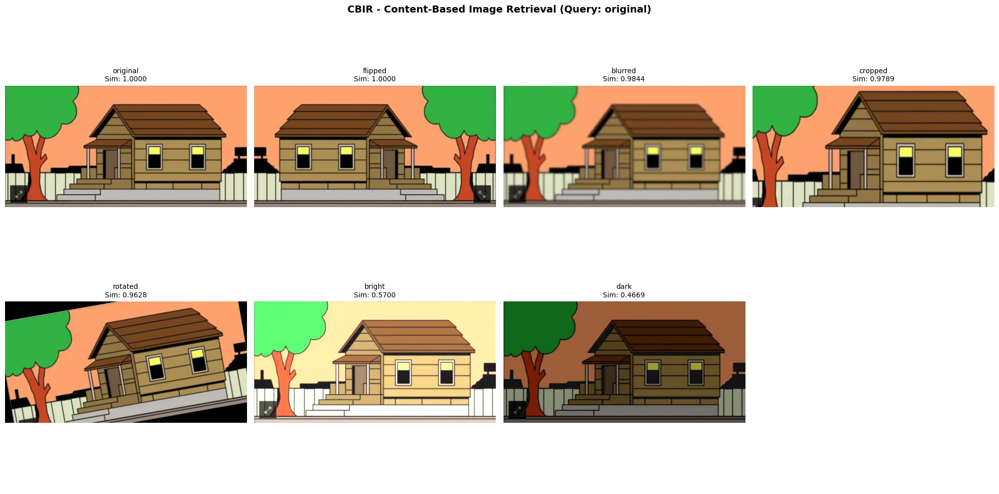

In [63]:
# Query: sử dụng ảnh gốc làm query
query_feat = db_features['original']

# Tính similarity (cosine similarity)
similarities = {}
for name, feat in db_features.items():
    sim = np.dot(query_feat, feat) / (np.linalg.norm(query_feat) * np.linalg.norm(feat))
    similarities[name] = sim

# Sắp xếp theo similarity giảm dần
sorted_results = sorted(similarities.items(), key=lambda x: x[1], reverse=True)

# Hiển thị kết quả CBIR
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (name, sim) in enumerate(sorted_results):
    if i < 8:
        axes[i].imshow(database[name][:, :, ::-1])
        axes[i].set_title(f'{name}\nSim: {sim:.4f}', fontsize=10)
        axes[i].axis('off')

# Ẩn subplot thừa
for j in range(len(sorted_results), 8):
    axes[j].axis('off')

plt.suptitle('CBIR - Content-Based Image Retrieval (Query: original)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

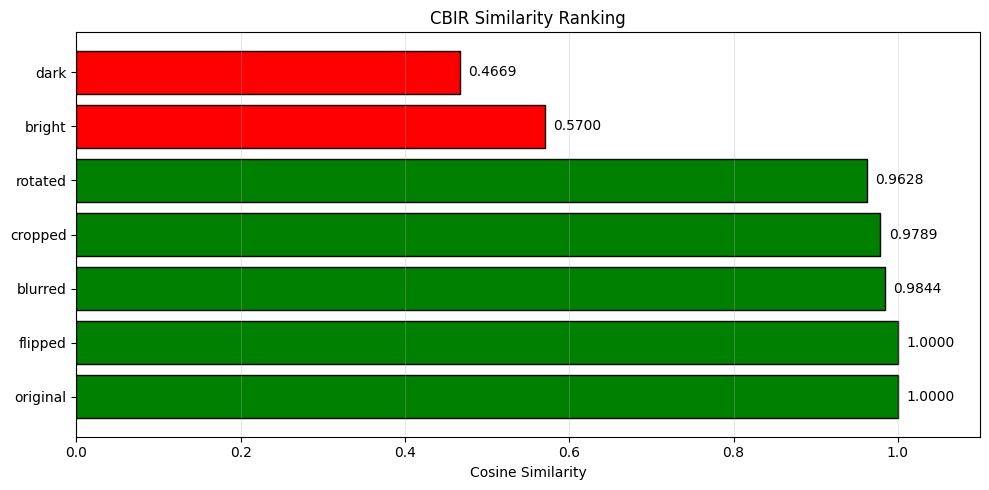

In [64]:
# Biểu đồ similarity
plt.figure(figsize=(10, 5))
names = [r[0] for r in sorted_results]
sims = [r[1] for r in sorted_results]
colors = ['green' if s > 0.95 else 'orange' if s > 0.8 else 'red' for s in sims]
plt.barh(names, sims, color=colors, edgecolor='black')
plt.xlabel('Cosine Similarity')
plt.title('CBIR Similarity Ranking')
plt.xlim(0, 1.1)
for i, (n, s) in enumerate(zip(names, sims)):
    plt.text(s + 0.01, i, f'{s:.4f}', va='center')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


## 12. Bag-of-Words with SIFT + Histogram


In [65]:

print("12. BAG-OF-WORDS WITH SIFT + HISTOGRAM")


12. BAG-OF-WORDS WITH SIFT + HISTOGRAM


Sử dụng SIFT descriptor


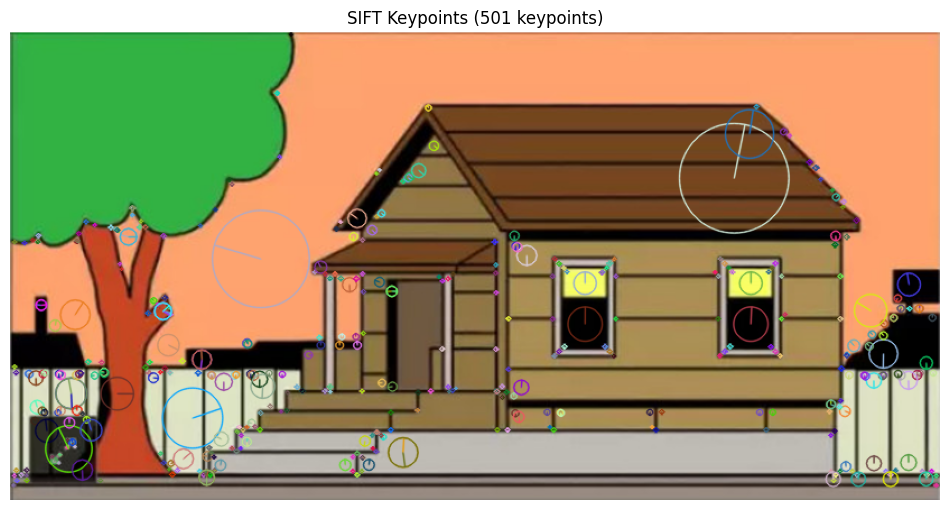

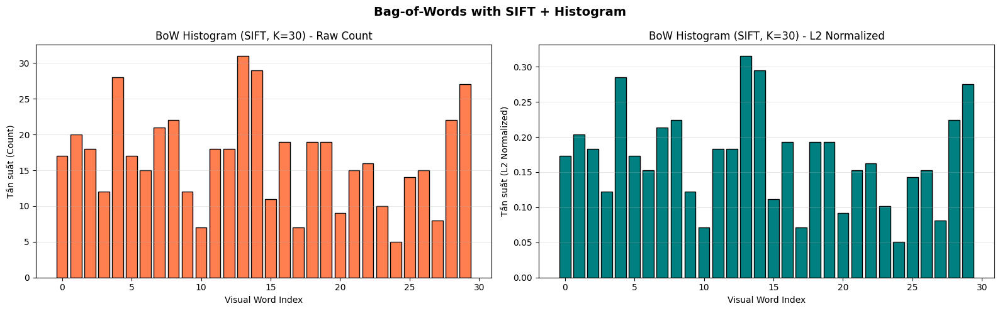


So sánh BoW SIFT histogram giữa các biến thể:


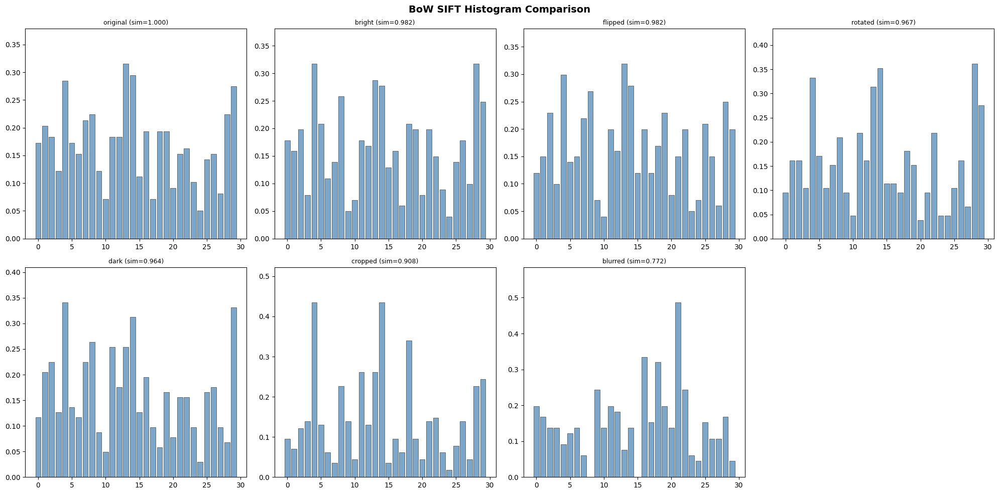

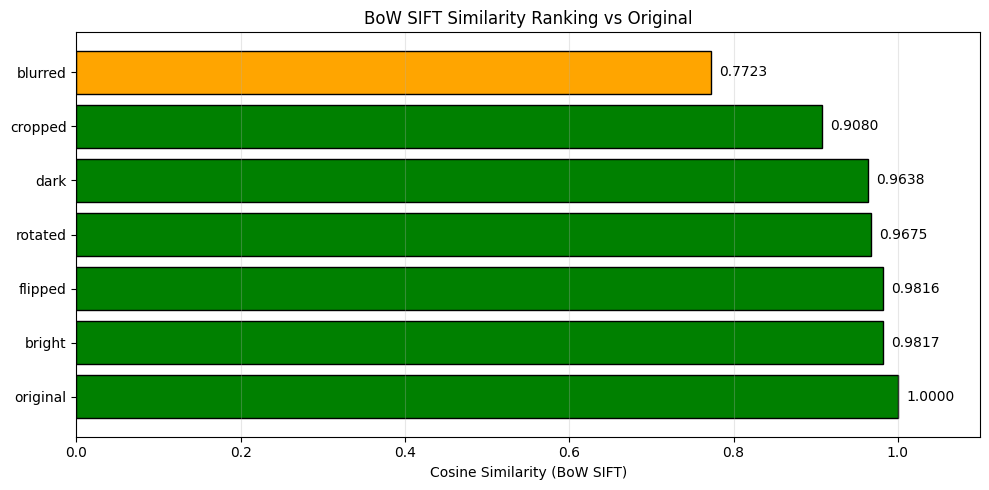

HOÀN THÀNH LAB 04: KEYPOINT DETECTION


In [66]:
# Sử dụng SIFT (có sẵn trong OpenCV ≥ 4.4)
try:
    sift = cv2.SIFT_create(nfeatures=500)
    print("Sử dụng SIFT descriptor")
except:
    sift = cv2.ORB_create(nfeatures=500)
    print("SIFT không khả dụng, sử dụng ORB thay thế")

# Phát hiện keypoints và descriptors cho ảnh
kp_sift, des_sift = sift.detectAndCompute(gray, None)

# Vẽ SIFT keypoints
img_sift = cv2.drawKeypoints(img, kp_sift, None, 
                              flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(12, 7))
plt.imshow(img_sift[:, :, ::-1])
plt.title(f'SIFT Keypoints ({len(kp_sift)} keypoints)')
plt.axis('off')
plt.show()

if des_sift is not None:
    # Tạo visual vocabulary bằng K-Means
    K_WORDS = 30  # Số visual words
    criteria_km = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 0.1)
    des_float_sift = np.float32(des_sift)
    
    ret, labels_sift, centers_sift = cv2.kmeans(
        des_float_sift, K_WORDS, None, criteria_km, 10, cv2.KMEANS_PP_CENTERS
    )
    
    # Tạo BoW histogram
    bow_hist_sift = np.zeros(K_WORDS)
    for label in labels_sift:
        bow_hist_sift[label[0]] += 1
    
    # Chuẩn hóa L2
    bow_hist_sift_norm = bow_hist_sift / np.linalg.norm(bow_hist_sift)
    
    # Hiển thị histogram
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    
    axes[0].bar(range(K_WORDS), bow_hist_sift, color='coral', edgecolor='black')
    axes[0].set_xlabel('Visual Word Index')
    axes[0].set_ylabel('Tần suất (Count)')
    axes[0].set_title(f'BoW Histogram (SIFT, K={K_WORDS}) - Raw Count')
    axes[0].grid(axis='y', alpha=0.3)
    
    axes[1].bar(range(K_WORDS), bow_hist_sift_norm, color='teal', edgecolor='black')
    axes[1].set_xlabel('Visual Word Index')
    axes[1].set_ylabel('Tần suất (L2 Normalized)')
    axes[1].set_title(f'BoW Histogram (SIFT, K={K_WORDS}) - L2 Normalized')
    axes[1].grid(axis='y', alpha=0.3)
    
    plt.suptitle('Bag-of-Words with SIFT + Histogram', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # So sánh BoW giữa các biến thể ảnh
    print("\nSo sánh BoW SIFT histogram giữa các biến thể:")
    
    bow_db = {}
    for name, db_img in database.items():
        db_gray = cv2.cvtColor(db_img, cv2.COLOR_BGR2GRAY)
        kp_db, des_db = sift.detectAndCompute(db_gray, None)
        
        if des_db is not None and len(des_db) > 0:
            des_db_float = np.float32(des_db)
            # Gán mỗi descriptor vào visual word gần nhất
            bow_h = np.zeros(K_WORDS)
            for d in des_db_float:
                dists = np.linalg.norm(centers_sift - d, axis=1)
                bow_h[np.argmin(dists)] += 1
            bow_h_norm = bow_h / (np.linalg.norm(bow_h) + 1e-10)
            bow_db[name] = bow_h_norm
        else:
            bow_db[name] = np.zeros(K_WORDS)
    
    # Tính cosine similarity giữa ảnh gốc và các biến thể
    query_bow = bow_db.get('original', np.zeros(K_WORDS))
    
    bow_similarities = {}
    for name, bow_h in bow_db.items():
        sim = np.dot(query_bow, bow_h) / (np.linalg.norm(query_bow) * np.linalg.norm(bow_h) + 1e-10)
        bow_similarities[name] = sim
    
    sorted_bow = sorted(bow_similarities.items(), key=lambda x: x[1], reverse=True)
    
    # Hiển thị bảng so sánh
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes_flat = axes.flatten()
    
    for i, (name, sim) in enumerate(sorted_bow):
        if i < 8:
            # Vẽ histogram cho mỗi biến thể
            axes_flat[i].bar(range(K_WORDS), bow_db[name], 
                            color='steelblue', alpha=0.7, edgecolor='black', linewidth=0.5)
            axes_flat[i].set_title(f'{name} (sim={sim:.3f})', fontsize=9)
            axes_flat[i].set_ylim(0, max(bow_db[name].max() * 1.2, 0.1))
    
    for j in range(len(sorted_bow), 8):
        axes_flat[j].axis('off')
    
    plt.suptitle('BoW SIFT Histogram Comparison', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Final similarity ranking
    plt.figure(figsize=(10, 5))
    names_bow = [r[0] for r in sorted_bow]
    sims_bow = [r[1] for r in sorted_bow]
    colors_bow = ['green' if s > 0.9 else 'orange' if s > 0.7 else 'red' for s in sims_bow]
    plt.barh(names_bow, sims_bow, color=colors_bow, edgecolor='black')
    plt.xlabel('Cosine Similarity (BoW SIFT)')
    plt.title('BoW SIFT Similarity Ranking vs Original')
    plt.xlim(0, 1.1)
    for i, (n, s) in enumerate(zip(names_bow, sims_bow)):
        plt.text(s + 0.01, i, f'{s:.4f}', va='center')
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()


print("HOÀN THÀNH LAB 04: KEYPOINT DETECTION")

